## Ebow method & silhouette scores to determine optimal k

In [30]:
# Import libraries
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer, MaxAbsScaler, QuantileTransformer, Normalizer   # this is to normalize data before applying Kmeans
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [31]:
rfm_v_data = pd.read_csv(r'C:\Users\argyr\OneDrive\Υπολογιστής\Diplvm\Giftware dataset\rfm_values.csv')
rfm_v_data.head()

,Customer ID,Recency,Frequency,Monetary
0,12346,432.0,34.0,368.36
1,12347,3.0,222.0,4921.53
2,12348,76.0,51.0,2019.40
3,12349,19.0,179.0,4419.49
4,12350,311.0,17.0,334.40


In [32]:
rfm_values = rfm_v_data[['Recency', 'Frequency', 'Monetary']]
rfm_values

,Recency,Frequency,Monetary
0,432.0,34.0,368.36
1,3.0,222.0,4921.53
2,76.0,51.0,2019.40
3,19.0,179.0,4419.49
4,311.0,17.0,334.40
...,...,...,...
5843,4.0,986.0,2736.65
5844,432.0,27.0,411.68
5845,661.0,12.0,427.00
5846,477.0,68.0,1215.43


In [33]:
customer_id_values = rfm_v_data[['Customer ID']]
customer_id_values

,Customer ID
0,12346
1,12347
2,12348
3,12349
4,12350
...,...
5843,18283
5844,18284
5845,18285
5846,18286


In [34]:
rec = rfm_v_data[['Recency']]
fig_rec = px.box(rec)
fig_rec.show()

In [35]:
freq = rfm_v_data[['Frequency']]
fig_freq = px.box(freq)
fig_freq.show()

In [36]:
mon = rfm_v_data[['Monetary']]
fig_mon = px.box(mon)
fig_mon.show()

In [37]:
# Normalize the RFM values using StandardScaler
scaler = StandardScaler()
rfm_normalized = scaler.fit_transform(rfm_values)
rfm_normalized
fig = px.box(rfm_normalized)
fig.show()

In [38]:
# Normalize the RFM values using MinMaxScaler
scaler = MinMaxScaler()
rfm_normalized = scaler.fit_transform(rfm_values)
rfm_normalized
fig = px.box(rfm_normalized)
fig.show()

In [39]:
# Normalize the RFM values using MaxAbsScaler
scaler = MaxAbsScaler()
rfm_normalized = scaler.fit_transform(rfm_values)
rfm_normalized
fig = px.box(rfm_normalized)
fig.show()

In [40]:
# Normalize the RFM values using RobustScaler
scaler = RobustScaler()
rfm_normalized = scaler.fit_transform(rfm_values)
rfm_normalized
fig = px.box(rfm_normalized)
fig.show()

In [41]:
# Normalize the RFM values using PowerTransformer
scaler = PowerTransformer()
rfm_normalized = scaler.fit_transform(rfm_values)
rfm_normalized
fig = px.box(rfm_normalized)
fig.show()

In [42]:
# Normalize the RFM values using QuantileTransformer
scaler = QuantileTransformer()
rfm_normalized = scaler.fit_transform(rfm_values)
rfm_normalized
fig = px.box(rfm_normalized)
fig.show()

In [43]:
# Normalize the RFM values using QuantileTransformer-Gaussian output
scaler = QuantileTransformer(output_distribution='normal')
rfm_normalized = scaler.fit_transform(rfm_values)
rfm_normalized
fig = px.box(rfm_normalized)
fig.show()

In [44]:
# Normalize the RFM values using Normalizer
scaler = Normalizer()
rfm_normalized = scaler.fit_transform(rfm_values)
rfm_normalized
fig = px.box(rfm_normalized)
fig.show()

In [45]:
# We select MinMaxScaler
scaler = MinMaxScaler()
rfm_normalized = scaler.fit_transform(rfm_values)
rfm_normalized

array([[5.84010840e-01, 2.56091883e-03, 6.36850791e-04],
       [2.71002710e-03, 1.71503958e-02, 8.50874219e-03],
       [1.01626016e-01, 3.88018004e-03, 3.49130331e-03],
       ...,
       [8.94308943e-01, 8.53639609e-04, 7.38232403e-04],
       [6.44986450e-01, 5.19944125e-03, 2.10133445e-03],
       [5.69105691e-02, 1.19509545e-02, 7.23189405e-03]])

In [46]:
########################################
#rfm_normalized = rfm_v_data[['Recency', 'Frequency', 'Monetary']]
########################################

In [47]:
# Elbow method to find the optimal number of clusters
sse = []
range_n_clusters = range(2, 21)

for k in range_n_clusters:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(rfm_normalized)
    sse.append(kmeans.inertia_)

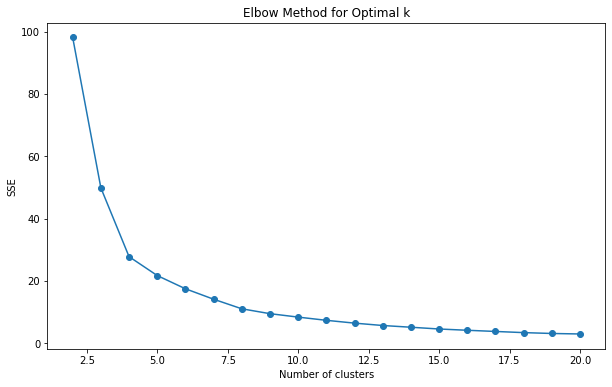

In [48]:
# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, sse, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.title('Elbow Method for Optimal k')
plt.show()

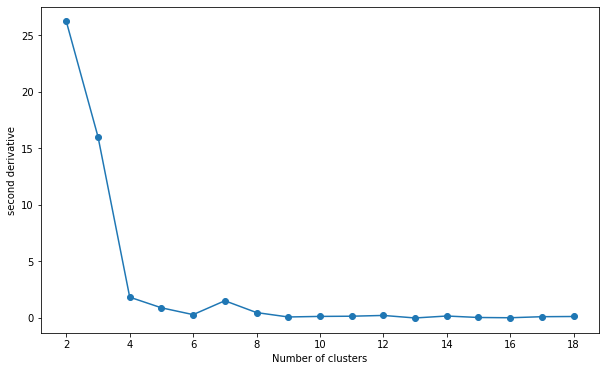

In [49]:
def second_derivative(data, h):
    return [(data[i-1] - 2*data[i] + data[i+1]) / h**2 for i in range(1, len(data)-1)]

d = second_derivative(sse,1)

plt.figure(figsize=(10, 6))
plt.plot(range(2,19), d, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('second derivative')
plt.show()

In [50]:
# The silhouette score is another useful method to evaluate the quality of your clustering. 
# It measures how similar an object is to its own cluster (cohesion) compared to other clusters (separation). 
# The silhouette score ranges from -1 to 1, where a higher score indicates better-defined clusters.

In [51]:
# Calculate silhouette scores for different numbers of clusters
silhouette_scores = []
range_n_clusters = range(2, 11)  # Typically, silhouette scores are not useful for k=1

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(rfm_normalized)
    silhouette_avg = silhouette_score(rfm_normalized, cluster_labels)
    silhouette_scores.append(silhouette_avg)

In [52]:
print(silhouette_scores)

[0.7204447892521589, 0.6807046088002382, 0.6618880598941058, 0.5991755322545509, 0.5935845424658189, 0.6019916593594296, 0.5489402480893045, 0.5433643090881495, 0.5211184841783191]


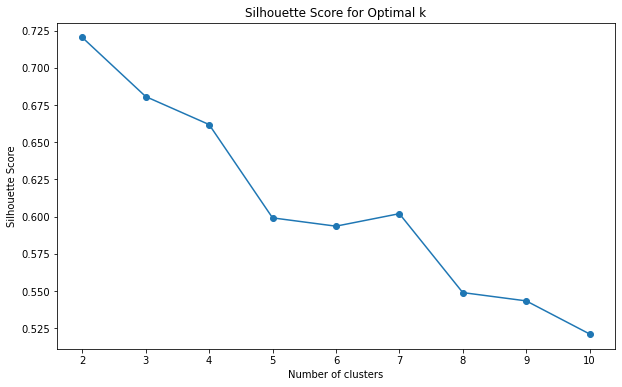

In [53]:
# Plot the silhouette scores to identify the best k
# Higher silhouette scores indicate better-defined clusters

plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal k')
plt.show()

In [54]:
# TODO 17 JUN 2024
#rfm_normalized = pd.DataFrame(rfm_normalized)
#rfm_normalized.columns = ["Recency", "Frequency", "Monetary"]
#rfm_normalized

#a = pd.DataFrame(customer_id_values, index=customer_id_values.index)
#b = pd.DataFrame(rfm_normalized,     index=rfm_normalized.index)
#c = pd.concat([a,b], axis=1)
#rfm_normalized = c
#rfm_normalized

In [55]:
rfm_normalized

array([[5.84010840e-01, 2.56091883e-03, 6.36850791e-04],
       [2.71002710e-03, 1.71503958e-02, 8.50874219e-03],
       [1.01626016e-01, 3.88018004e-03, 3.49130331e-03],
       ...,
       [8.94308943e-01, 8.53639609e-04, 7.38232403e-04],
       [6.44986450e-01, 5.19944125e-03, 2.10133445e-03],
       [5.69105691e-02, 1.19509545e-02, 7.23189405e-03]])

In [56]:
# Apply k-means clustering
optimal_clusters = 3
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
rfm_v_data['Cluster'] = kmeans.fit_predict(rfm_normalized)
rfm_v_data

,Customer ID,Recency,Frequency,Monetary,Cluster
0,12346,432.0,34.0,368.36,2
1,12347,3.0,222.0,4921.53,0
2,12348,76.0,51.0,2019.40,0
3,12349,19.0,179.0,4419.49,0
4,12350,311.0,17.0,334.40,2
...,...,...,...,...,...
5843,18283,4.0,986.0,2736.65,0
5844,18284,432.0,27.0,411.68,2
5845,18285,661.0,12.0,427.00,1
5846,18286,477.0,68.0,1215.43,1


In [57]:
# Analyze the clusters
cluster_analysis = rfm_v_data.groupby('Cluster').mean()
print(cluster_analysis)

          Customer ID     Recency   Frequency     Monetary
Cluster                                                   
0        15295.967409   52.863788  192.304457  4080.372532
1        15402.510828  595.298089   30.836943   594.939975
2        15326.272234  345.989138   58.607604  1003.721005


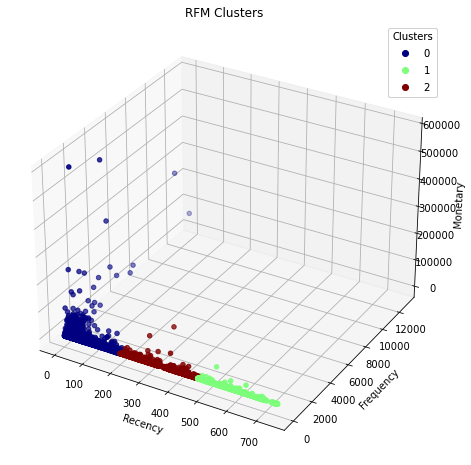

In [58]:
# Plot the clusters in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    rfm_v_data['Recency'], rfm_v_data['Frequency'], rfm_v_data['Monetary'],
    c=rfm_v_data['Cluster'], cmap='jet', marker='o'
)

ax.set_xlabel('Recency')
ax.set_ylabel('Frequency')
ax.set_zlabel('Monetary')
ax.set_title('RFM Clusters')



# Add legend
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)

plt.show()